In [ ]:
import pandas as pd

housing = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing.csv')
# housing.head()

housing['id'].value_counts().value_counts()


1    21260
2      175
3        1
Name: id, dtype: int64

In [ ]:
housing['price_per_sqft'] = housing['price'] / housing['sqft_living']
housing['price_per_sqft'].head()

0    188.050847
1    209.338521
2    233.766234
3    308.163265
4    303.571429
Name: price_per_sqft, dtype: float64

In [ ]:
import altair as alt
alt.data_transformers.disable_max_rows()
alt.Chart(housing).mark_circle().encode(
    alt.X('price_per_sqft'),
    alt.Y('count()'),
    color='zipcode'
).interactive()

alt.Chart(...)

In [ ]:
housing['zipcode'].unique()

array([98178, 98125, 98028, 98136, 98074, 98053, 98003, 98198, 98146,
       98038, 98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133,
       98040, 98092, 98030, 98119, 98112, 98052, 98027, 98117, 98058,
       98001, 98056, 98166, 98023, 98070, 98148, 98105, 98042, 98008,
       98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98010,
       98118, 98199, 98032, 98045, 98102, 98077, 98108, 98168, 98177,
       98065, 98029, 98006, 98109, 98022, 98033, 98155, 98024, 98011,
       98031, 98106, 98072, 98188, 98014, 98055, 98039])

In [ ]:
alt.data_transformers.disable_max_rows()
alt.Chart(housing).mark_circle().encode(
    alt.X('zipcode', scale=alt.Scale(zero=False),bin=alt.Bin(maxbins=7)),
    alt.Y('price_per_sqft')
).interactive()

alt.Chart(...)

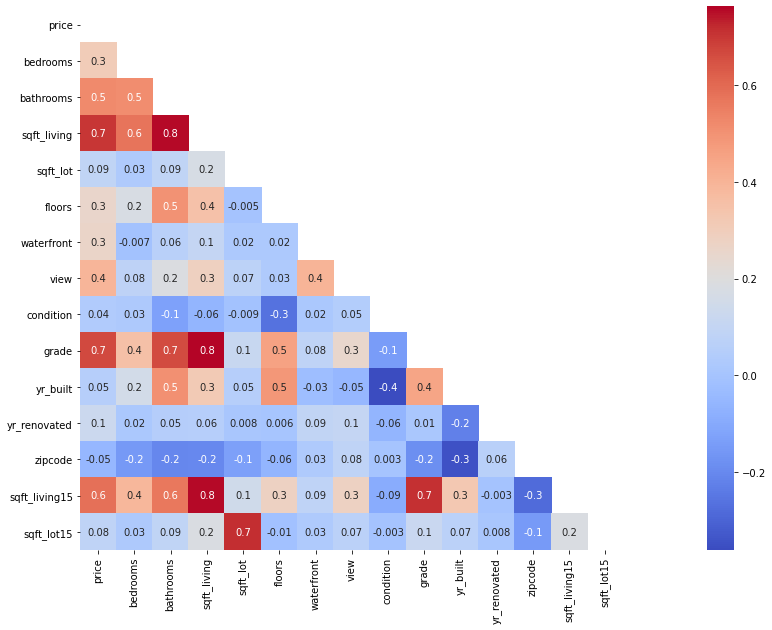

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
housing = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing.csv')
plt.figure(figsize=(30, 10)) #change figure size
arr = ['id', 'sqft_above', 'sqft_basement', 'lat', 'long']
mask = np.triu(np.ones_like(housing.drop(arr, axis=1).corr(), dtype=bool))

sns.heatmap(housing.drop(arr, axis = 1).corr(), #data parameter/arguement
            mask=mask,
            annot = True, # Adds the Correlation value to each square
            fmt = '.1g', #reduce decimal places
            cmap = "coolwarm", #change the color scheme
            square = True
)

In [ ]:
import altair as alt
# correlation = housing.drop(['id'], axis=1).corr()
# correlation.round(3).sort_values("price", ascending=False)['price']
# alt.Chart(correlation).mark_bar(
#     alt.X(0),
#     alt.Y()
# )

In [ ]:
for i in range(len(housing)):
  if(housing['yr_renovated'][i] == 0):
    housing['yr_renovated'][i] = housing['yr_built'][i]#change all year renovated 0 to the same year it was built

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
# Import the libraries we need
housing = housing[housing['price'] < 2000000]#filtering out the data over 2 million because there are lots of outliers there
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
housing_drop = housing.drop(['date', 'id', 'price'], axis=1)#drop date, id, and price

housing_drop = housing_drop.drop(['zipcode'], axis=1)#drop zipcode to move to far right column
housing_drop['zipcode'] = housing['zipcode']#add back in to far right column

housing_drop['zipcode'] = housing_drop['zipcode'].astype('str')#convert zipcodes to string for get dummies
housing_drop = pd.get_dummies(housing_drop)#make lots of columns for zipcodes

housing_drop.head()

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,zipcode_98001,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,...,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,1955,47.5112,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,1933,47.7379,-122.233,2720,8062,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,1965,47.5208,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,1987,47.6168,-122.045,1800,7503,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
scaler = MinMaxScaler()
housing_drop = pd.DataFrame(scaler.fit_transform(housing_drop))#normalize the data, convert each column to a value between 0 and 1 instead of its usual values, which are all over the place.

mapper = {0:'price', 1:'bedrooms', 2:'bathrooms', 3:'sqft_living', 4:'sqft_lot', 5:'floors', 6:'waterfront', 7:'view', 8:'condition', 9:'grade',
          10:'sqft_above', 11:'sqft_basement', 12:'yr_built', 13:'yr_renovated', 14:'lat', 15:'long', 16:'sqft_living15', 17:'sqft_lot15'}#transform does not keep column names, map to rename
housing_drop.rename(mapper, axis=1, inplace=1)#rename the columns with above mapping
housing_drop.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86
0,0.090909,0.133333,0.119624,0.003108,0.0,0.0,0.0,0.5,0.500000,0.124825,0.000000,0.478261,0.478261,0.571498,0.217608,0.174550,0.005742,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.090909,0.300000,0.306452,0.004072,0.4,0.0,0.0,0.5,0.500000,0.263675,0.122699,0.443478,0.791304,0.908959,0.166113,0.239473,0.008027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.060606,0.133333,0.064516,0.005743,0.0,0.0,0.0,0.5,0.416667,0.067321,0.000000,0.286957,0.286957,0.936143,0.237542,0.430532,0.008513,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.121212,0.400000,0.224462,0.002714,0.0,0.0,0.0,1.0,0.500000,0.106592,0.279141,0.565217,0.565217,0.586939,0.104651,0.178260,0.004996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.090909,0.266667,0.186828,0.004579,0.0,0.0,0.0,0.5,0.583333,0.194951,0.000000,0.756522,0.756522,0.741354,0.393688,0.259878,0.007871,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Get our target variable and features and split them into test and train datasets
X = housing_drop.drop(['lat', 'long', 'price'], axis=1)
y = housing['price']

X_test, X_train, y_test, y_train = train_test_split(X, y, test_size=0.25, random_state=42)#Split the data

# Create the model and train it
model = XGBRegressor(objective="reg:squarederror", subsample=0.5)#create the model
model.fit(X_train, y_train)#fit the model

# Get predictions for our test data
predictions = model.predict(X_test)#predictions array generated
predictions

# Compute the Root Mean Squared Error of the predictions
from sklearn.metrics import mean_squared_error
result = mean_squared_error(y_test, predictions, squared=False)#find the mean squared error between predictions and actual
result.round(3)

109648.725